In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.insert(0, '../')
import rhkpy

import matplotlib.pyplot as pl
import numpy as np
import xarray as xr
import hvplot.xarray
import holoviews as hv

# Plotting tests

In [118]:
fpath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\ABC\STM\stacking faults\FLG25(9) - 6 layer' + '\\'
m = rhkpy.rhkdata(fpath + 'MK_ABC_FLG_25_9K_2023_07_24_17_51_20_911.sm4')

In [119]:
m_abs = m.coord_to_absolute()

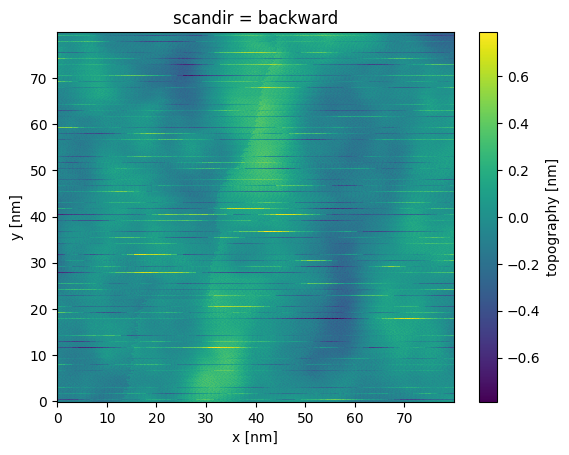

In [120]:
m.image.topography[:, :, 1].plot(cmap = 'viridis', x = 'x')

In [121]:
m.image.topography[:, :, 1].hvplot.image(cmap = 'viridis', x = 'x')

:Image   [x,y]   (topography)

In [122]:
m_abs.image.topography[:, :, 1].hvplot.image(cmap = 'viridis', x = 'x')

:Image   [x,y]   (topography)

In [123]:
m.spectra.mean(dim = ['repetitions', 'biasscandir']).lia.sel(bias = -0.05, method = 'nearest').hvplot.image(cmap = 'viridis', x = 'specpos_x')

:Image   [specpos_x,specpos_y]   (lia)

In [124]:
m.qplot()

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] HoloViews(DynamicMap, sizing_mode='fixed')
        [1] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='bias', options=OrderedDict([('-0.627', ...]), value=-0.627000059466809, width=250)

In [29]:
filename_izmap = 'Iz_map_Stripes-9K-HOPG-SPI2-3_2021_09_08_11_21_03_743.sm4'
izmap = rhkpy.rhkdata(filename_izmap)

In [30]:
izmap_abs = izmap.coord_to_absolute()

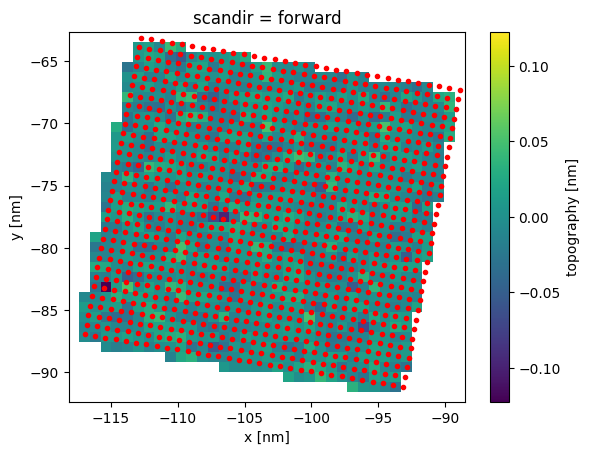

In [31]:
izmap_abs.image.topography[:, :, 0].plot(cmap = 'viridis')
pl.scatter(izmap.spectra.x.data, izmap.spectra.y.data, color = 'r', marker = '.')

In [32]:
izmap_abs.qplot()

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] HoloViews(DynamicMap, sizing_mode='fixed')
        [1] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='z', options=OrderedDict([('0', ...]), value=0.0, width=250)

In [125]:
datapath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\cikkek - published\2022\RG magnetism\figures\splitting' + '\\'
filename_map209 = '9K_ABC6_2020_11_02_08_47_19_209.sm4'
map209 = rhkpy.rhkdata(datapath + filename_map209)

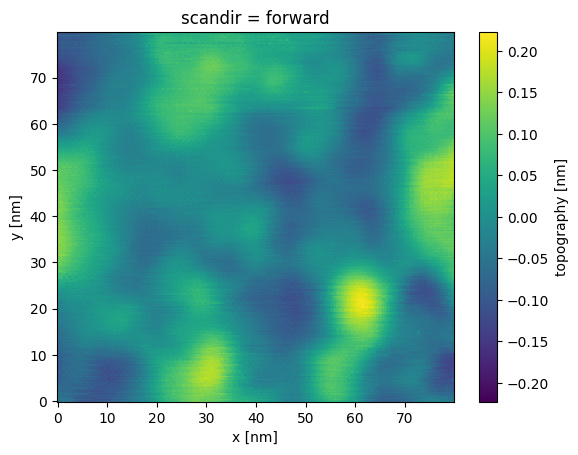

In [126]:
map209.image.topography[:, :, 0].plot(cmap = 'viridis', x = 'x')

C:\Users\zrbyt\WPy64-31090\python-3.10.9.amd64\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


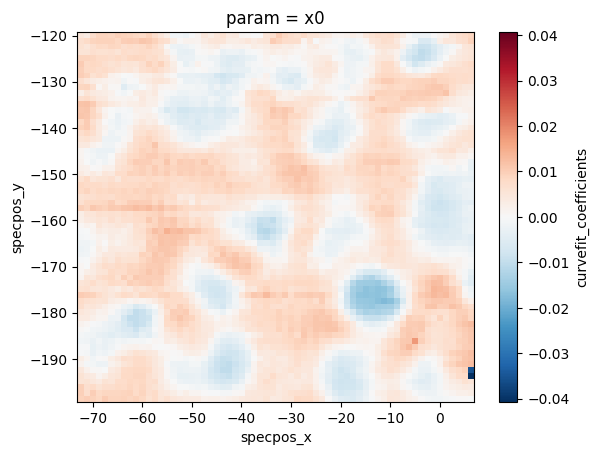

In [115]:
map209_slice = map209.spectra.lia.sel(bias = slice(0.15, -0.15)).mean(dim = ['repetitions', 'biasscandir'])
fit209 = rhkpy.peakfit(map209_slice, stval = {'x0': 0})
fit209['curvefit_coefficients'].sel(param = 'x0').plot(x = 'specpos_x')

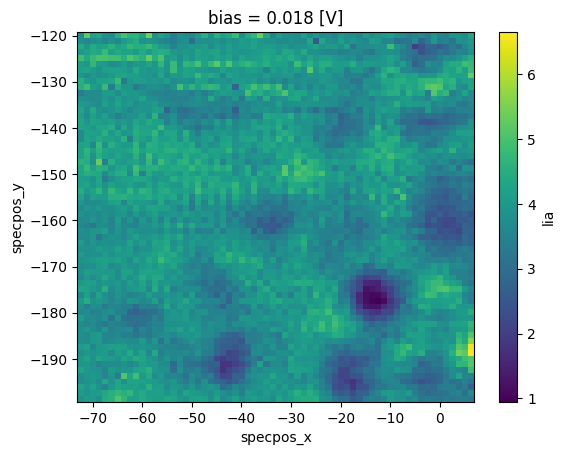

In [127]:
map209_slice[65, :, :].plot(x = 'specpos_x')

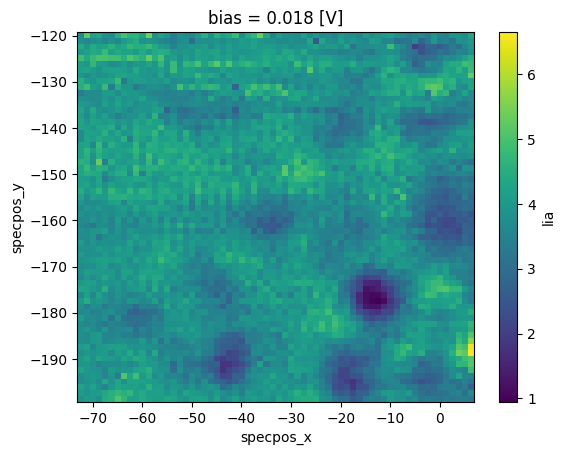

In [117]:
map209_slice[65, :, :].plot()

In [128]:
map209.qplot()

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] HoloViews(DynamicMap, sizing_mode='fixed')
        [1] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='bias', options=OrderedDict([('-0.2', ...]), value=-0.20000001601874828, width=250)

Plot the spectrum positions in hvplot

In [41]:
temp = map209.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])

In [45]:
temp.hvplot.scatter(x = 'specpos_x', y = 'specpos_y', aspect = 1, color = 'red', marker = 'dot')

:Scatter   [specpos_x]   (specpos_y)

In [129]:
filename = 'line_9K_ABC6_2020_11_01_12_12_27_213.sm4'
linespec = rhkpy.rhkdata(filename)

In [130]:
linespec.qplot()

:Image   [bias,dist]   (lia)

In [100]:
izline_filename = 'Iz_line_Stripes-9K-HOPG-SPI2-3_2021_09_02_15_15_35_930.sm4'
izline = rhkpy.rhkdata(izline_filename)

In [101]:
izline.spectra

<xarray.Dataset>
Dimensions:      (z: 51, dist: 32, repetitions: 10, zscandir: 2)
Coordinates:
  * z            (z) float64 0.0 0.01 0.02 0.03 0.04 ... 0.46 0.47 0.48 0.49 0.5
  * dist         (dist) float64 0.0 0.2411 0.4821 0.7232 ... 6.991 7.232 7.473
  * repetitions  (repetitions) int32 0 1 2 3 4 5 6 7 8 9
  * zscandir     (zscandir) <U4 'up' 'down'
Data variables:
    current      (z, dist, repetitions, zscandir) float64 -38.11 ... -2.934
    x            (dist) float64 -216.2 -216.0 -215.9 ... -211.9 -211.7 -211.6
    y            (dist) float64 -306.0 -306.2 -306.4 ... -311.5 -311.7 -311.9
Attributes: (12/14)
    filename:           Iz_line_Stripes-9K-HOPG-SPI2-3_2021_09_02_15_15_35_93...
    bias:               -0.6
    bias units:         V
    setpoint:           -39.99999984016789
    setpoint units:     pA
    measurement date:   09/02/21
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1250.0
    LI frequency unit:  Hz
    LI phase:           -101.9999999
    datatype:           line
    spectype:           iz

In [103]:
izline.qplot()

:Image   [z,dist]   (current)

In [131]:
filename_singlespec = 'dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4'
spec = rhkpy.rhkdata(filename_singlespec)

In [132]:
spec.qplot()

:Layout
   .Overlay.I  :Overlay
      .Curve.I  :Curve   [bias]   (lia)
      .Curve.II :Curve   [bias]   (lia)
   .Overlay.II :Overlay
      .Curve.I  :Curve   [bias]   (current)
      .Curve.II :Curve   [bias]   (current)

In [137]:
iz_single_filename = 'Iz_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_15_28_529.sm4'
izspec = rhkpy.rhkdata(iz_single_filename)

In [143]:
izspec.qplot()

:Overlay
   .Curve.I  :Curve   [z]   (current)
   .Curve.II :Curve   [z]   (current)

In [133]:
filename_izmap = 'Iz_map_Stripes-9K-HOPG-SPI2-3_2021_09_08_11_21_03_743.sm4'
izmap = rhkpy.rhkdata(filename_izmap)

In [134]:
izmap.qplot()

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] HoloViews(DynamicMap, sizing_mode='fixed')
        [1] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='z', options=OrderedDict([('0', ...]), value=0.0, width=250)